In [4]:
# Import necessary libraries
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
os.listdir('/home/ak/.config/matplotlib')
plt.style.use('/home/ak/.config/matplotlib/latexstyle.mplstyle')
folder = '/home/ak/Documents/Research/PaperCode/Thesis Plots'

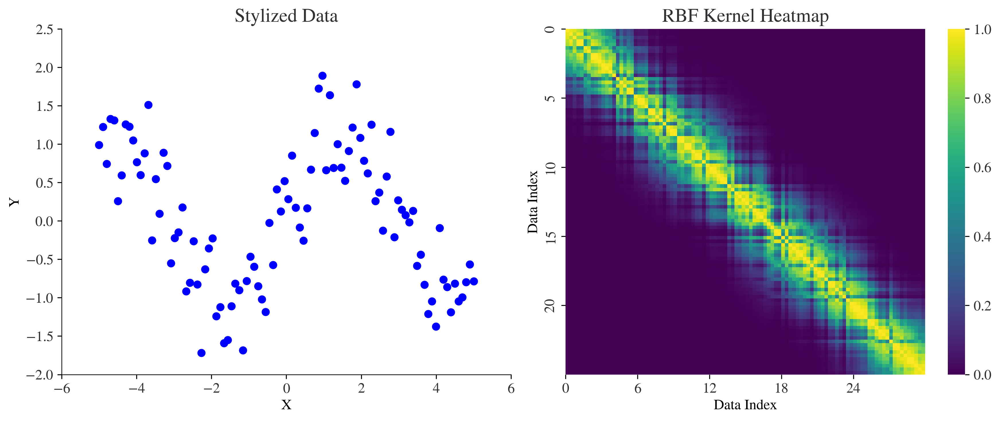

In [20]:


# Generate stylized data: A range of points in 2D space
X = np.linspace(-5, 5, 100)
Y = np.sin(X) + 0.5 * np.random.randn(100)

# Define the RBF kernel function
def rbf_kernel(x1, x2, sigma=1.0):
    distance = np.linalg.norm(np.array(x1) - np.array(x2))
    return np.exp(-distance**2 / (2 * sigma**2))

# Compute the kernel matrix
K = np.zeros((100, 100))
for i in range(100):
    for j in range(100):
        K[i, j] = rbf_kernel([X[i], Y[i]], [X[j], Y[j]])

# Plot the dataset
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.scatter(X, Y, color='blue')
plt.title("Stylized Data", loc ='center')
plt.xlabel("X")
plt.ylabel("Y")

# Plot the heatmap of kernel values
plt.subplot(1, 2, 2)
sns.heatmap(K, cmap='viridis')
plt.title("RBF Kernel Heatmap", loc= 'center')
plt.xlabel("Data Index")
plt.ylabel("Data Index")
ticks = np.arange(0, K.shape[0], 20)  # Adjust the 20 to whatever step you prefer
plt.xticks(ticks)
plt.yticks(ticks)
title = 'rbf_similarity.png'
filePath = os.path.join(folder, title)
plt.savefig(filePath, dpi = 300)  
plt.tight_layout()
plt.show()


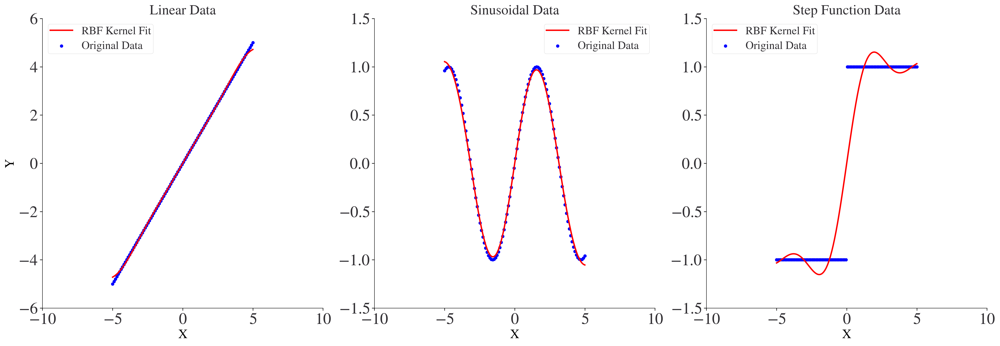

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.kernel_ridge import KernelRidge

# Generate diverse datasets
X = np.linspace(-5, 5, 100).reshape(-1, 1)

Y_linear = X
Y_sin = np.sin(X)
Y_step = np.where(X < 0, -1, 1)

datasets = [Y_linear, Y_sin, Y_step]
titles = ['Linear', 'Sinusoidal', 'Step Function']

# Fit Kernel Ridge Regression with RBF kernel for each dataset
plt.figure(figsize=(20, 7))
for i, Y in enumerate(datasets):
    kr = KernelRidge(kernel='rbf', alpha=0.1, gamma=0.1)
    kr.fit(X, Y)
    
    Y_pred = kr.predict(X)
    
    ax = plt.subplot(1, 3, i + 1)
    plt.scatter(X, Y, color='blue', s=15, label="Original Data")
    plt.plot(X, Y_pred, color='red', label="RBF Kernel Fit")
    plt.title(f"{titles[i]} Data", loc='center', fontsize=20)
    plt.xlabel("X", fontsize=18)
    ax.tick_params(axis='both', which='major', labelsize=23)
    if i == 0:
        plt.ylabel("Y", fontsize=18)
    plt.legend(fontsize=16)
title = 'universal_kernel.png'
filePath = os.path.join(folder, title)
plt.savefig(filePath, dpi = 300)  
plt.tight_layout()
plt.show()


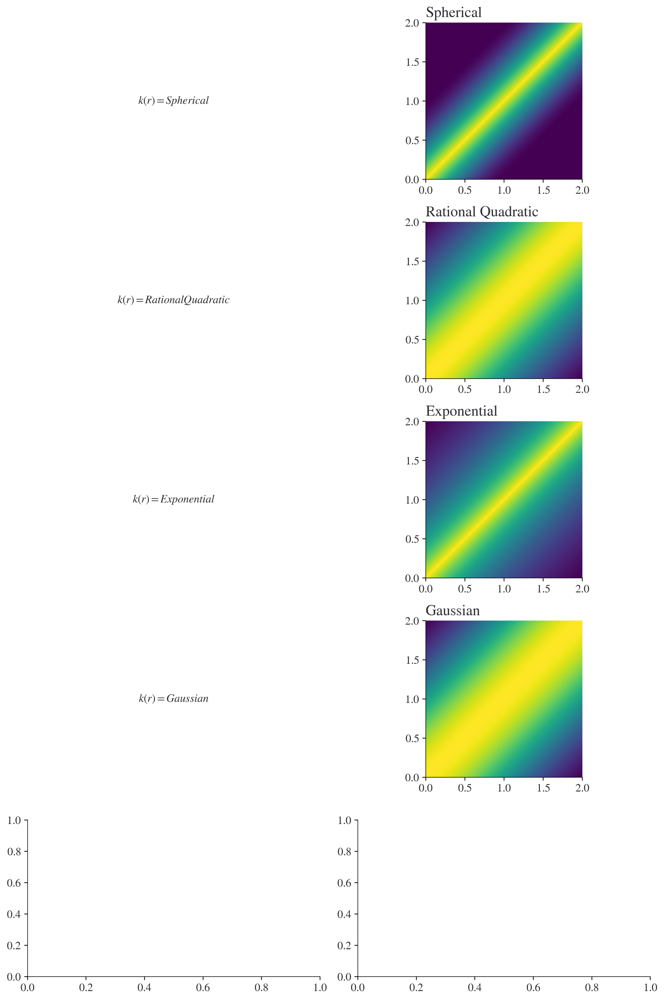

In [22]:
import numpy as np
import matplotlib.pyplot as plt

# Define the kernels
def spherical(r):
    return np.where(r < 1, 1 - 1.5 * r + 0.5 * r**3, 0)

def rational_quadratic(r, alpha=1, l=1):
    return (1 + r**2 / (2 * alpha * l**2))**-alpha

def exponential(r, l=1):
    return np.exp(-r/l)

def gaussian(r, l=1):
    return np.exp(-r**2 / (2 * l**2))

# Stylised data
x = np.linspace(0, 2, 400)
r = np.abs(x[:, None] - x[None, :])

# Plot
fig, axs = plt.subplots(5, 2, figsize=(10, 15))

kernels = [spherical, rational_quadratic, exponential, gaussian]
names = ["Spherical", "Rational Quadratic", "Exponential", "Gaussian"]

for ax, kernel, name in zip(axs, kernels, names):
    ax[0].text(0.5, 0.5, "$k(r) = {}$".format(name), ha='center', va='center', fontsize=12)
    ax[0].axis('off')
    
    ax[1].imshow(kernel(r), extent=(0,2,0,2), origin='lower')
    ax[1].set_title(name)

plt.tight_layout()
plt.show()


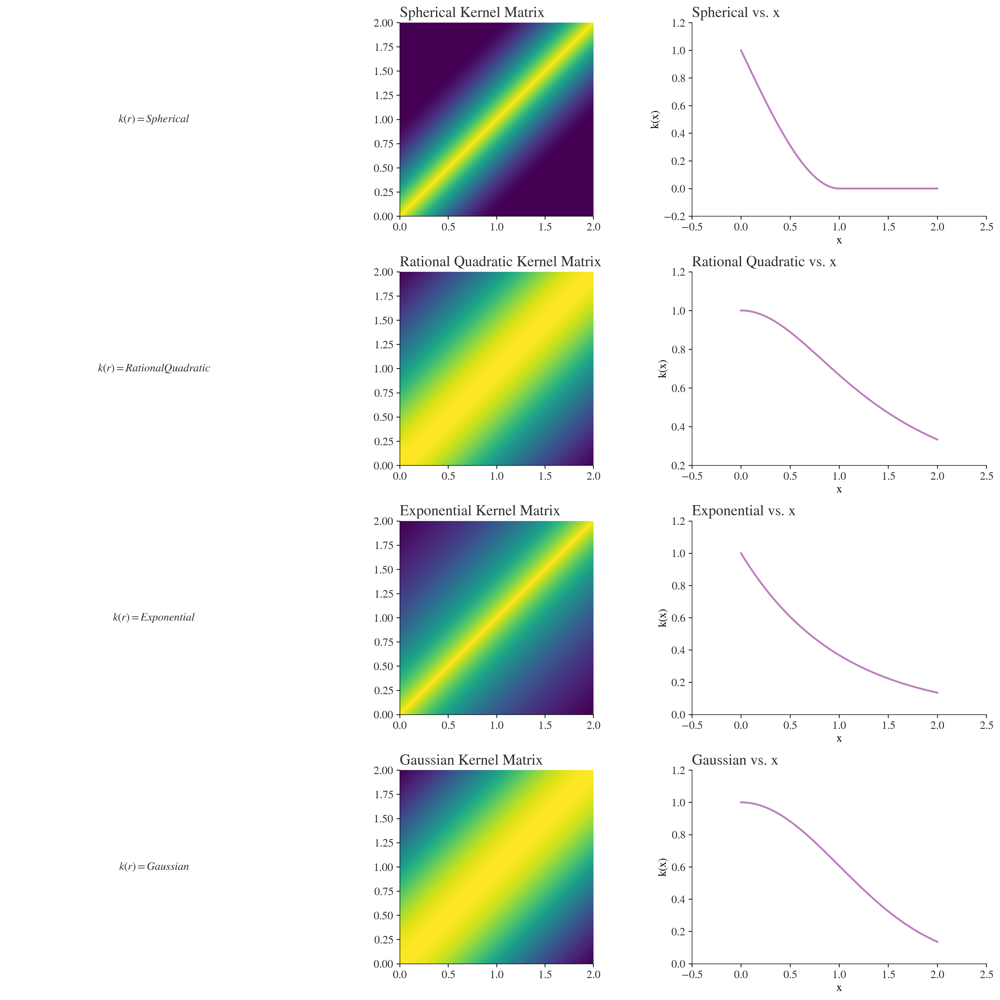

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# Define the kernels
def spherical(r):
    return np.where(r < 1, 1 - 1.5 * r + 0.5 * r**3, 0)

def rational_quadratic(r, alpha=1, l=1):
    return (1 + r**2 / (2 * alpha * l**2))**-alpha

def exponential(r, l=1):
    return np.exp(-r/l)

def gaussian(r, l=1):
    return np.exp(-r**2 / (2 * l**2))

# Stylised data
x = np.linspace(0, 2, 400)
r = np.abs(x[:, None] - x[None, :])

# Plot
fig, axs = plt.subplots(4, 3, figsize=(15, 15))

kernels = [spherical, rational_quadratic, exponential, gaussian]
names = ["Spherical", "Rational Quadratic", "Exponential", "Gaussian"]

for ax, kernel, name in zip(axs, kernels, names):
    ax[0].text(0.5, 0.5, "$k(r) = {}$".format(name), ha='center', va='center', fontsize=12)
    ax[0].axis('off')
    
    ax[1].imshow(kernel(r), extent=(0,2,0,2), origin='lower')
    ax[1].set_title(name + " Kernel Matrix")
    
    ax[2].plot(x, kernel(x))
    ax[2].set_title(name + " vs. x")
    ax[2].set_xlabel("x")
    ax[2].set_ylabel("k(x)")

plt.tight_layout()
plt.show()


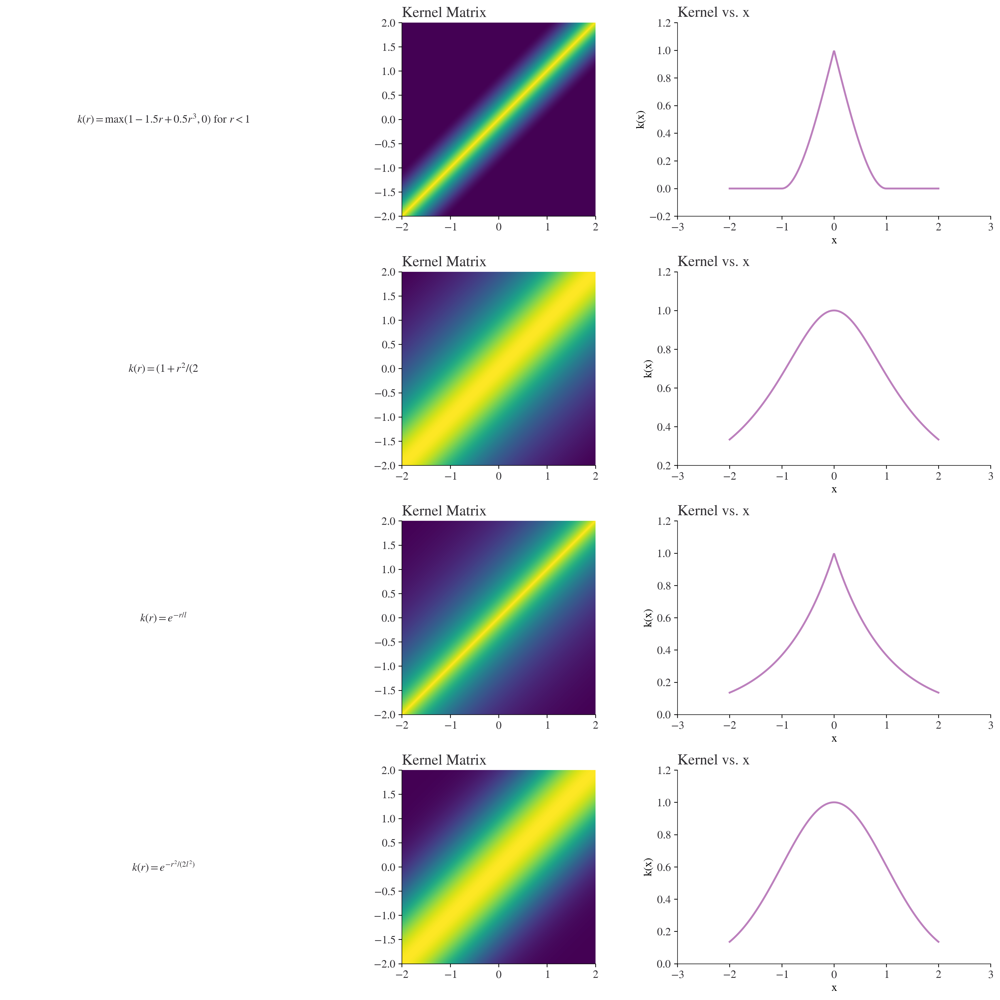

In [24]:
import numpy as np
import matplotlib.pyplot as plt

# Define the kernels
def spherical(r):
    return np.where(r < 1, 1 - 1.5 * r + 0.5 * r**3, 0)

def rational_quadratic(r, alpha=1, l=1):
    return (1 + r**2 / (2 * alpha * l**2))**-alpha

def exponential(r, l=1):
    return np.exp(-r/l)

def gaussian(r, l=1):
    return np.exp(-r**2 / (2 * l**2))

# Stylised data
x = np.linspace(-2, 2, 400)
r = np.abs(x[:, None] - x[None, :])

# Plot
fig, axs = plt.subplots(4, 3, figsize=(15, 15))

kernels = [spherical, rational_quadratic, exponential, gaussian]
equations = [
    "$k(r) = \max(1 - 1.5r + 0.5r^3, 0)$ for $r < 1$",
    "$k(r) = (1 + r^2 / (2\alpha l^2))^{-\alpha}$",
    "$k(r) = e^{-r/l}$",
    "$k(r) = e^{-r^2 / (2l^2)}$"
]

for ax, kernel, equation in zip(axs, kernels, equations):
    ax[0].text(0.5, 0.5, equation, ha='center', va='center', fontsize=12)
    ax[0].axis('off')
    
    ax[1].imshow(kernel(r), extent=(-2,2,-2,2), origin='lower')
    ax[1].set_title("Kernel Matrix")
    
    ax[2].plot(x, kernel(np.abs(x)))
    ax[2].set_title("Kernel vs. x")
    ax[2].set_xlabel("x")
    ax[2].set_ylabel("k(x)")

plt.tight_layout()
plt.show()


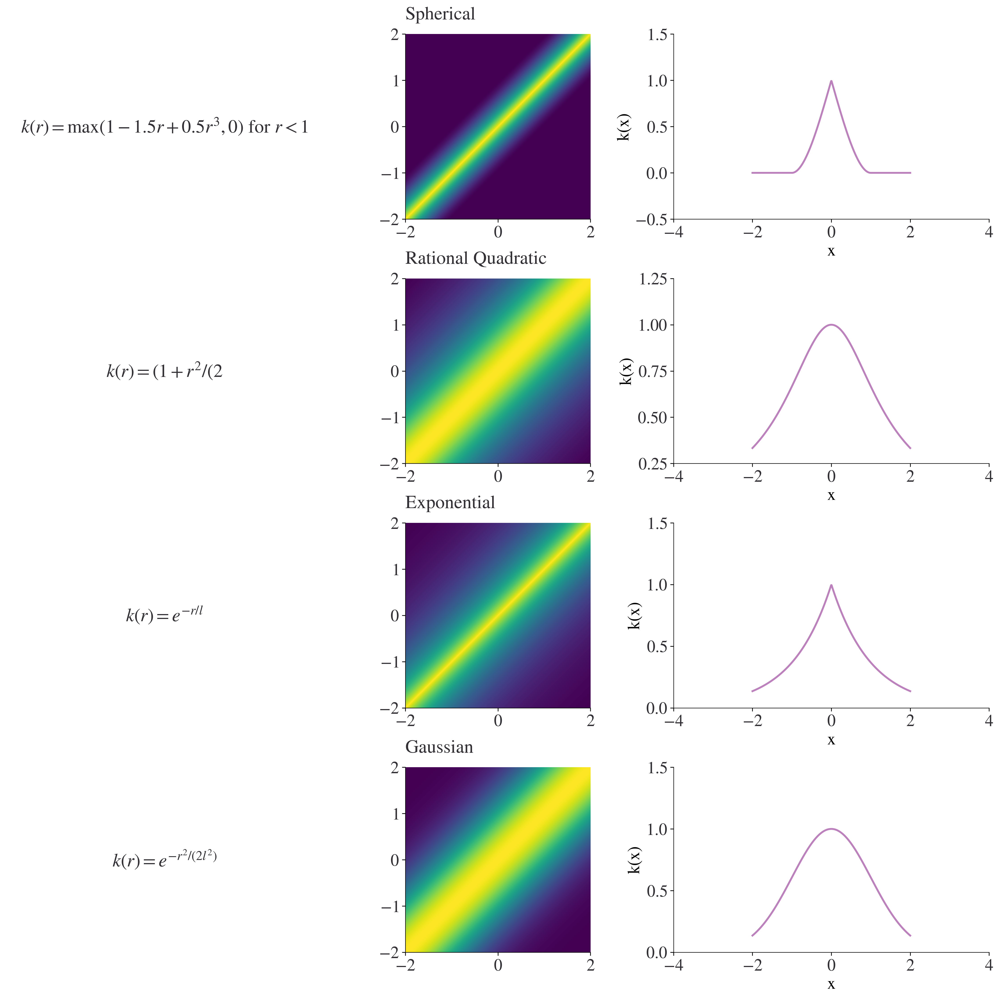

In [30]:
import numpy as np
import matplotlib.pyplot as plt

# Define the kernels
def spherical(r):
    return np.where(r < 1, 1 - 1.5 * r + 0.5 * r**3, 0)

def rational_quadratic(r, alpha=1, l=1):
    return (1 + r**2 / (2 * alpha * l**2))**-alpha

def exponential(r, l=1):
    return np.exp(-r/l)

def gaussian(r, l=1):
    return np.exp(-r**2 / (2 * l**2))

# Stylised data
x = np.linspace(-2, 2, 400)
r = np.abs(x[:, None] - x[None, :])

# Plot
fig, axs = plt.subplots(4, 3, figsize=(15, 15))

kernels = [spherical, rational_quadratic, exponential, gaussian]
kernel_names = ["Spherical", "Rational Quadratic", "Exponential", "Gaussian"]
equations = [
    "$k(r) = \max(1 - 1.5r + 0.5r^3, 0)$ for $r < 1$",
    "$k(r) = (1 + r^2 / (2\alpha l^2))^{-\alpha}$",
    "$k(r) = e^{-r/l}$",
    "$k(r) = e^{-r^2 / (2l^2)}$"
]

for ax, kernel, equation, name in zip(axs, kernels, equations, kernel_names):
    ax[0].text(0.5, 0.5, equation, ha='center', va='center', fontsize=20)
    ax[0].axis('off')
    
    ax[1].imshow(kernel(r), extent=(-2,2,-2,2), origin='lower')
    ax[1].set_title(name, fontsize=20, y=1.05)
    ax[1].tick_params(axis='both', which='major', labelsize=18)
    
    ax[2].plot(x, kernel(np.abs(x)))
    ax[2].set_xlabel("x", fontsize=18)
    ax[2].set_ylabel("k(x)", fontsize=18)
    ax[2].tick_params(axis='both', which='major', labelsize=18)

plt.tight_layout()
title = 'exmp_isotropic_stationary_kernels.png'
filePath = os.path.join(folder, title)
plt.savefig(filePath, dpi = 300)  
plt.tight_layout()
plt.show()


/home/ak/anaconda3/envs/timeSeries/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in arccos
  
/home/ak/anaconda3/envs/timeSeries/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in sqrt
  


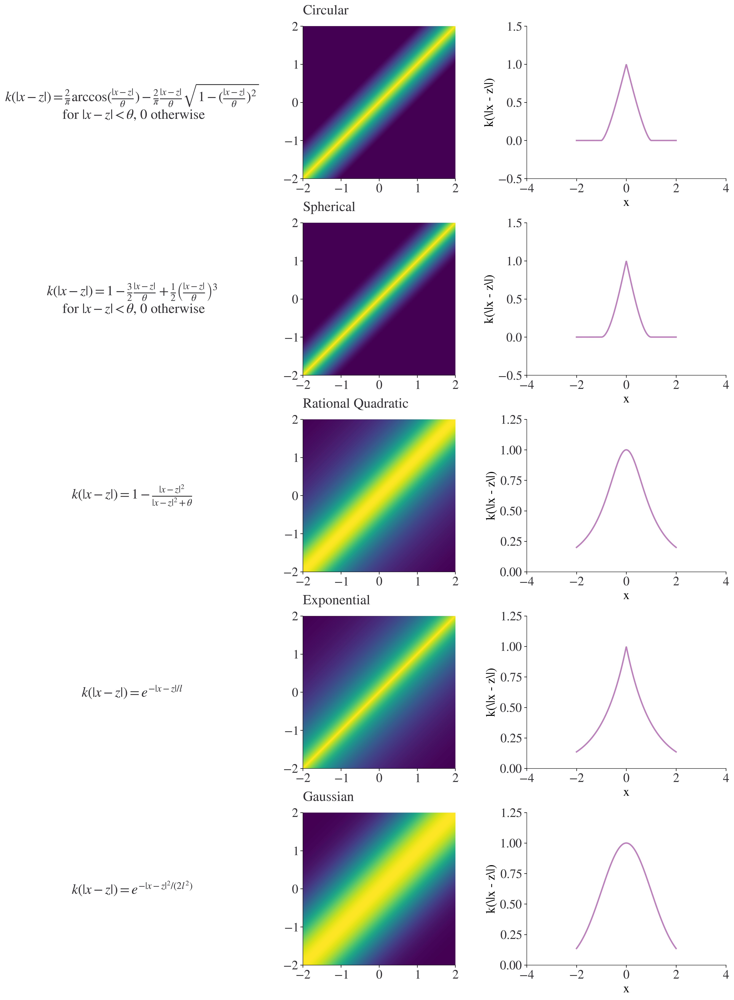

In [27]:
import numpy as np
import matplotlib.pyplot as plt

# Define the kernels
def circular(r, theta=1):
    val = (2/np.pi) * np.arccos(r/theta) - (2/np.pi) * (r/theta) * np.sqrt(1 - (r/theta)**2)
    return np.where(r < theta, val, 0)

def spherical(r, theta=1):
    result = 1 - (1.5 * r/theta) + 0.5 * (r/theta)**3
    return np.where(r < theta, result, 0)

def rational_quadratic(r, theta=1):
    return 1 - (r**2 / (r**2 + theta))

def exponential(r, l=1):
    return np.exp(-r/l)

def gaussian(r, l=1):
    return np.exp(-r**2 / (2 * l**2))

# Stylised data
x = np.linspace(-2, 2, 400)
r = np.abs(x[:, None] - x[None, :])

# Plot
fig, axs = plt.subplots(5, 3, figsize=(15, 20))

kernels = [circular, spherical, rational_quadratic, exponential, gaussian]
kernel_names = ["Circular", "Spherical", "Rational Quadratic", "Exponential", "Gaussian"]
equations = [
    "$k(\\|x - z\\|) = \\frac{2}{\\pi} \\arccos(\\frac{\\|x - z\\|}{\\theta}) - \\frac{2}{\\pi} \\frac{\\|x - z\\|}{\\theta} \\sqrt{1 - (\\frac{\\|x - z\\|}{\\theta})^2}$\n for $\\|x - z\\| < \\theta$, 0 otherwise",
    "$k(\\|x - z\\|) = 1 - \\frac{3}{2} \\frac{\\|x - z\\|}{\\theta} + \\frac{1}{2} \\left(\\frac{\\|x - z\\|}{\\theta}\\right)^3$\n for $\\|x - z\\| < \\theta$, 0 otherwise",
    "$k(\\|x - z\\|) = 1 - \\frac{\\|x - z\\|^2}{\\|x - z\\|^2 + \\theta}$",
    "$k(\\|x - z\\|) = e^{-\\|x - z\\|/l}$",
    "$k(\\|x - z\\|) = e^{-\\|x - z\\|^2 / (2l^2)}$"
]

for ax, kernel, equation, name in zip(axs, kernels, equations, kernel_names):
    ax[0].text(0.5, 0.5, equation, ha='center', va='center', fontsize=20)
    ax[0].axis('off')
    
    ax[1].imshow(kernel(r), extent=(-2,2,-2,2), origin='lower')
    ax[1].set_title(name, fontsize=20, y=1.05)
    ax[1].tick_params(axis='both', which='major', labelsize=18)
    
    ax[2].plot(x, kernel(np.abs(x)))
    ax[2].set_xlabel("x", fontsize=18)
    ax[2].set_ylabel("k(\\|x - z\\|)", fontsize=18)
    ax[2].tick_params(axis='both', which='major', labelsize=18)

plt.tight_layout()
plt.show()


/home/ak/anaconda3/envs/timeSeries/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in arccos
  
/home/ak/anaconda3/envs/timeSeries/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in sqrt
  


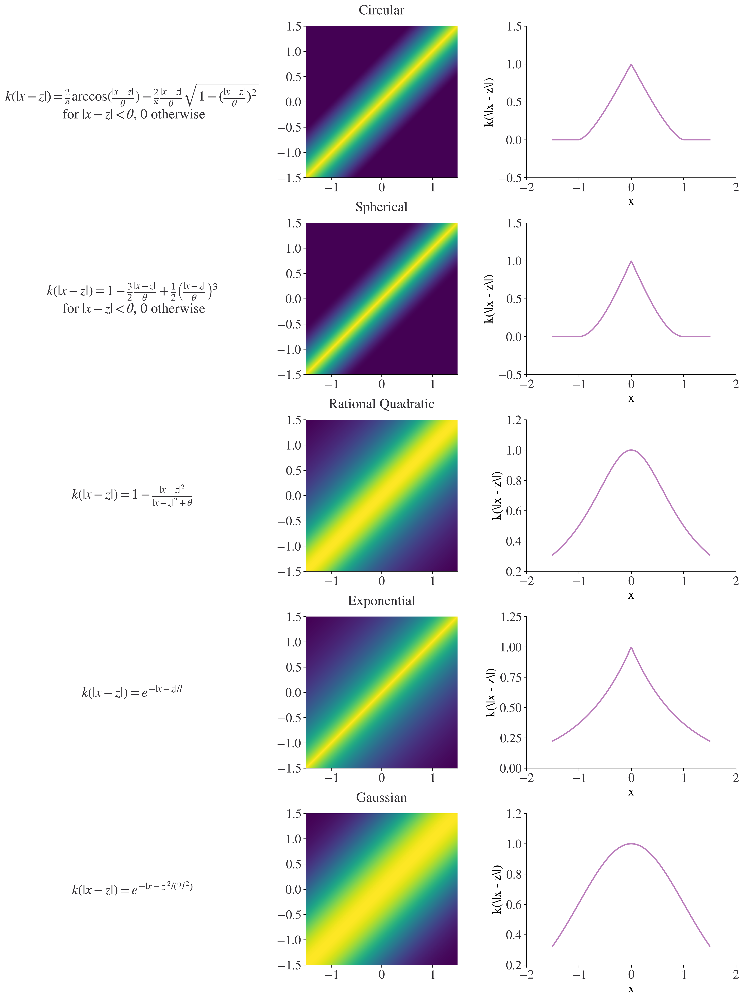

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Define the kernels
def circular(r, theta=1):
    val = (2/np.pi) * np.arccos(r/theta) - (2/np.pi) * (r/theta) * np.sqrt(1 - (r/theta)**2)
    return np.where(r < theta, val, 0)

def spherical(r, theta=1):
    result = 1 - (1.5 * r/theta) + 0.5 * (r/theta)**3
    return np.where(r < theta, result, 0)

def rational_quadratic(r, theta=1):
    return 1 - (r**2 / (r**2 + theta))

def exponential(r, l=1):
    return np.exp(-r/l)

def gaussian(r, l=1):
    return np.exp(-r**2 / (2 * l**2))

# Stylised data
x = np.linspace(-1.5, 1.5, 400)
r = np.abs(x[:, None] - x[None, :])

# Plot
fig, axs = plt.subplots(5, 3, figsize=(15, 20))

kernels = [circular, spherical, rational_quadratic, exponential, gaussian]
kernel_names = ["Circular", "Spherical", "Rational Quadratic", "Exponential", "Gaussian"]
equations = [
    "$k(\\|x - z\\|) = \\frac{2}{\\pi} \\arccos(\\frac{\\|x - z\\|}{\\theta}) - \\frac{2}{\\pi} \\frac{\\|x - z\\|}{\\theta} \\sqrt{1 - (\\frac{\\|x - z\\|}{\\theta})^2}$\n for $\\|x - z\\| < \\theta$, 0 otherwise",
    "$k(\\|x - z\\|) = 1 - \\frac{3}{2} \\frac{\\|x - z\\|}{\\theta} + \\frac{1}{2} \\left(\\frac{\\|x - z\\|}{\\theta}\\right)^3$\n for $\\|x - z\\| < \\theta$, 0 otherwise",
    "$k(\\|x - z\\|) = 1 - \\frac{\\|x - z\\|^2}{\\|x - z\\|^2 + \\theta}$",
    "$k(\\|x - z\\|) = e^{-\\|x - z\\|/l}$",
    "$k(\\|x - z\\|) = e^{-\\|x - z\\|^2 / (2l^2)}$"
]

for ax, kernel, equation, name in zip(axs, kernels, equations, kernel_names):
    ax[0].text(0.5, 0.5, equation, ha='center', va='center', fontsize=20)
    ax[0].axis('off')
    
    ax[1].imshow(kernel(r), extent=(-1.5,1.5,-1.5,1.5), origin='lower')
    ax[1].set_title(name, fontsize=20, loc='center', y=1.05)
    ax[1].tick_params(axis='both', which='major', labelsize=18)
    
    ax[2].plot(x, kernel(np.abs(x)))
    ax[2].set_xlabel("x", fontsize=18)
    ax[2].set_ylabel("k(\\|x - z\\|)", fontsize=18)
    ax[2].tick_params(axis='both', which='major', labelsize=18)


plt.tight_layout()
title = 'exmp_isotropic_stationary_kernels.png'
filePath = os.path.join(folder, title)
plt.savefig(filePath, dpi = 300)  
plt.tight_layout()
plt.show()


/home/ak/anaconda3/envs/timeSeries/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in arccos
  
/home/ak/anaconda3/envs/timeSeries/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in sqrt
  
/home/ak/anaconda3/envs/timeSeries/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in true_divide
/home/ak/anaconda3/envs/timeSeries/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in multiply


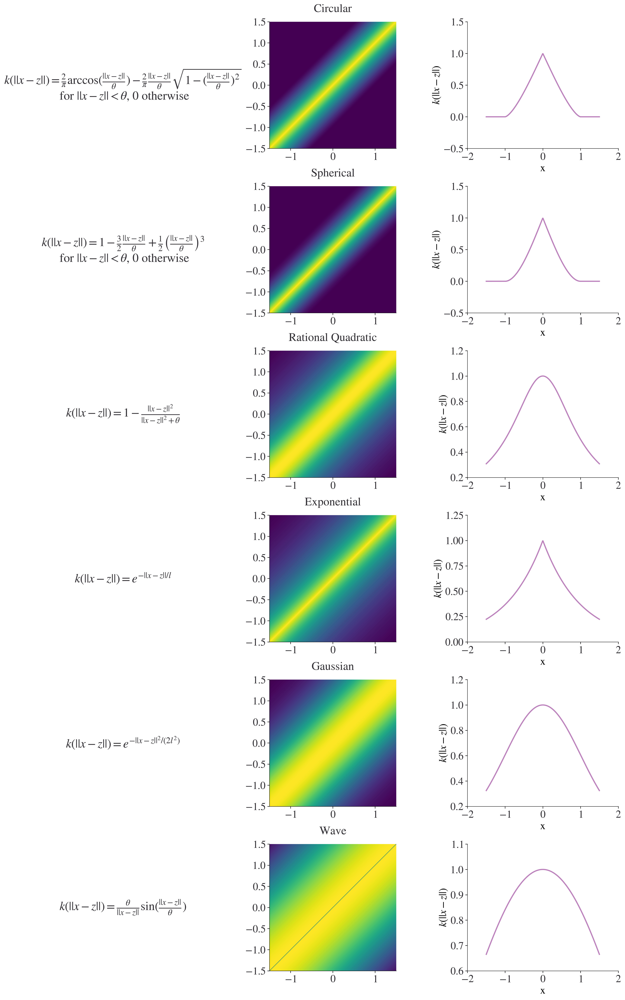

In [43]:
import numpy as np
import matplotlib.pyplot as plt

# Define the kernels
def circular(r, theta=1):
    val = (2/np.pi) * np.arccos(r/theta) - (2/np.pi) * (r/theta) * np.sqrt(1 - (r/theta)**2)
    return np.where(r < theta, val, 0)

def spherical(r, theta=1):
    result = 1 - (1.5 * r/theta) + 0.5 * (r/theta)**3
    return np.where(r < theta, result, 0)

def rational_quadratic(r, theta=1):
    return 1 - (r**2 / (r**2 + theta))

def exponential(r, l=1):
    return np.exp(-r/l)

def gaussian(r, l=1):
    return np.exp(-r**2 / (2 * l**2))

def wave(r, theta=1):
    return np.where(r != 0, theta / r * np.sin(r / theta), 0)

# Stylised data
x = np.linspace(-1.5, 1.5, 400)
r = np.abs(x[:, None] - x[None, :])

# Plot
fig, axs = plt.subplots(6, 3, figsize=(15, 24))

kernels = [circular, spherical, rational_quadratic, exponential, gaussian, wave]
kernel_names = ["Circular", "Spherical", "Rational Quadratic", "Exponential", "Gaussian", "Wave"]
equations = [
    "$k(\\||x - z\\||) = \\frac{2}{\\pi} \\arccos(\\frac{\\||x - z\\||}{\\theta}) - \\frac{2}{\\pi} \\frac{\\||x - z\\||}{\\theta} \\sqrt{1 - (\\frac{\\||x - z\\||}{\\theta})^2}$\n for $\\||x - z\\|| < \\theta$, 0 otherwise",
    "$k(\\||x - z\\||) = 1 - \\frac{3}{2} \\frac{\\||x - z\\||}{\\theta} + \\frac{1}{2} \\left(\\frac{\\||x - z\\||}{\\theta}\\right)^3$\n for $\\||x - z\\|| < \\theta$, 0 otherwise",
    "$k(\\||x - z\\||) = 1 - \\frac{\\||x - z\\||^2}{\\||x - z\\||^2 + \\theta}$",
    "$k(\\||x - z\\||) = e^{-\\||x - z\\||/l}$",
    "$k(\\||x - z\\||) = e^{-\\||x - z\\||^2 / (2l^2)}$",
    "$k(\\||x - z\\||) = \\frac{\\theta}{\\||x - z\\||} \\sin(\\frac{\\||x - z\\||}{\\theta})$"
]

for ax, kernel, equation, name in zip(axs, kernels, equations, kernel_names):
    ax[0].text(0.5, 0.5, equation, ha='center', va='center', fontsize=21)
    ax[0].axis('off')
    
    ax[1].imshow(kernel(r), extent=(-1.5,1.5,-1.5,1.5), origin='lower')
    ax[1].set_title(name, fontsize=20,loc='center', y=1.05)
    ax[1].tick_params(axis='both', which='major', labelsize=18)
    
    ax[2].plot(x, kernel(np.abs(x)))
    ax[2].set_xlabel("x", fontsize=18)
    ax[2].set_ylabel("$k(||x - z||)$", fontsize=18)
    ax[2].tick_params(axis='both', which='major', labelsize=18)

plt.tight_layout()
title = 'exmp_isotropic_stationary_kernels.png'
filePath = os.path.join(folder, title)
plt.savefig(filePath, dpi = 300)  
plt.tight_layout()
plt.show()
